In [239]:
import pandas as pd
import numpy as np

In [240]:
fd_001_train = pd.read_csv('C:/Users/Игорь/Downloads/nasa-cmaps/CMaps/train_FD001.txt',header=None,sep=' ')

In [241]:
fd_001_test = pd.read_csv('C:/Users/Игорь/Downloads/nasa-cmaps/CMaps/test_FD001.txt',header=None,sep=' ')

In [242]:
fd_001_train.drop(columns=[26,27],inplace=True)

In [243]:
fd_001_test.drop(columns=[26,27],inplace=True)

In [244]:
columns = ['unit_number','time_in_cycles','setting_1','setting_2','TRA','T2','T24','T30','T50','P2','P15','P30','Nf',
           'Nc','epr','Ps30','phi','NRf','NRc','BPR','farB','htBleed','Nf_dmd','PCNfR_dmd','W31','W32' ]

In [245]:
fd_001_train.columns = columns

In [246]:
fd_001_test.columns = columns

In [247]:
fd_001_train.head()

,unit_number,time_in_cycles,setting_1,setting_2,TRA,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [248]:
# удалим колонки с константными значениями
fd_001_train.drop(columns=['Nf_dmd','PCNfR_dmd','P2','T2','TRA','farB','epr'],inplace=True)


In [249]:
count = fd_001_train.groupby('unit_number').count().reset_index()

In [250]:
count.head()

,unit_number,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,Nc,Ps30,phi,NRf,NRc,BPR,htBleed,W31,W32
0,1,192,192,192,192,192,192,192,192,192,192,192,192,192,192,192,192,192,192
1,2,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287
2,3,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179
3,4,189,189,189,189,189,189,189,189,189,189,189,189,189,189,189,189,189,189
4,5,269,269,269,269,269,269,269,269,269,269,269,269,269,269,269,269,269,269


In [251]:
count['time_in_cycles'].min()

128

In [252]:
count['time_in_cycles'].max()

362

In [253]:
count[count['time_in_cycles'] > 240].sort_values('time_in_cycles', ascending = False)

,unit_number,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,Nc,Ps30,phi,NRf,NRc,BPR,htBleed,W31,W32
68,69,362,362,362,362,362,362,362,362,362,362,362,362,362,362,362,362,362,362
91,92,341,341,341,341,341,341,341,341,341,341,341,341,341,341,341,341,341,341
95,96,336,336,336,336,336,336,336,336,336,336,336,336,336,336,336,336,336,336
66,67,313,313,313,313,313,313,313,313,313,313,313,313,313,313,313,313,313,313
82,83,293,293,293,293,293,293,293,293,293,293,293,293,293,293,293,293,293,293
1,2,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287,287
63,64,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283
94,95,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283,283
85,86,278,278,278,278,278,278,278,278,278,278,278,278,278,278,278,278,278,278
16,17,276,276,276,276,276,276,276,276,276,276,276,276,276,276,276,276,276,276


## Так как классы в обучающей выборке распределены неравномерно, каждому классу, начиная от минимального количества циклов до поломки (в fd_001_train это соответствует 128 ) будем относить по 5 двигателей, число циклов до поломки каждого класса будет определяться как среднее арифметическое 5 реализаций жизенного цикла в отсортированном исходном наборе fd_001_train

In [254]:
sorted_data = count.sort_values('time_in_cycles', ascending = True).reset_index()

In [255]:
sorted_data.head()

,index,unit_number,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,Nc,Ps30,phi,NRf,NRc,BPR,htBleed,W31,W32
0,38,39,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128
1,90,91,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135,135
2,69,70,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137
3,56,57,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137,137
4,57,58,147,147,147,147,147,147,147,147,147,147,147,147,147,147,147,147,147,147


## Разбиение на классы fd_001_train

In [256]:
classes = {}
units_in_class = 10


In [257]:
for i in range(0,len(sorted_data),units_in_class):
    list_=[]
    for j in range(units_in_class):
        list_.append(sorted_data['unit_number'][i+j])
    print(list_)
    classes[int(i/units_in_class) + 1] = list_    
        #classes[int(i/5) + 1] = [sorted_data['unit_number'][i],sorted_data['unit_number'][i+1],sorted_data['unit_number'][i+2],
                  #sorted_data['unit_number'][i+3],sorted_data['unit_number'][i+4]]

[39, 91, 70, 57, 58, 24, 8, 65, 90, 77]
[93, 27, 98, 45, 19, 36, 13, 29, 28, 74]
[23, 37, 12, 60, 63, 87, 3, 62, 14, 35]
[99, 61, 80, 40, 6, 85, 4, 32, 44, 1]
[55, 30, 38, 18, 21, 53, 34, 42, 50, 26]
[68, 79, 33, 100, 9, 66, 22, 97, 15, 43]
[71, 16, 76, 73, 52, 51, 72, 88, 47, 82]
[49, 41, 89, 10, 75, 25, 59, 48, 78, 20]
[31, 81, 11, 46, 54, 94, 7, 84, 5, 56]
[17, 86, 95, 64, 2, 83, 67, 96, 92, 69]


In [258]:
classes

{1: [39, 91, 70, 57, 58, 24, 8, 65, 90, 77],
 2: [93, 27, 98, 45, 19, 36, 13, 29, 28, 74],
 3: [23, 37, 12, 60, 63, 87, 3, 62, 14, 35],
 4: [99, 61, 80, 40, 6, 85, 4, 32, 44, 1],
 5: [55, 30, 38, 18, 21, 53, 34, 42, 50, 26],
 6: [68, 79, 33, 100, 9, 66, 22, 97, 15, 43],
 7: [71, 16, 76, 73, 52, 51, 72, 88, 47, 82],
 8: [49, 41, 89, 10, 75, 25, 59, 48, 78, 20],
 9: [31, 81, 11, 46, 54, 94, 7, 84, 5, 56],
 10: [17, 86, 95, 64, 2, 83, 67, 96, 92, 69]}

In [259]:
def data_classificator(x):
    for class_number in classes:
        if x['unit_number'] in classes[class_number]:
            return class_number
    return 'Class not found'
    
    

In [260]:
fd_001_train['Class_number'] = fd_001_train.apply(data_classificator,axis=1)

In [261]:
# проверка правильности разбиения на классы
fd_001_train[fd_001_train['Class_number'] == 6].groupby('unit_number').count()

,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,Nc,Ps30,phi,NRf,NRc,BPR,htBleed,W31,W32,Class_number
unit_number,,,,,,,,,,,,,,,,,,,
9,201,201,201,201,201,201,201,201,201,201,201,201,201,201,201,201,201,201,201
15,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207
22,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202
33,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200,200
43,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207,207
66,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202
68,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199
79,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199
97,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202,202


## Оценим длину жизненного цикла в тестовых данных

In [262]:
test_count = fd_001_test.groupby('unit_number').count()

In [263]:
test_count.head()

,time_in_cycles,setting_1,setting_2,TRA,T2,T24,T30,T50,P2,P15,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
unit_number,,,,,,,,,,,,,,,,,,,,,
1,31,31,31,31,31,31,31,31,31,31,...,31,31,31,31,31,31,31,31,31,31
2,49,49,49,49,49,49,49,49,49,49,...,49,49,49,49,49,49,49,49,49,49
3,126,126,126,126,126,126,126,126,126,126,...,126,126,126,126,126,126,126,126,126,126
4,106,106,106,106,106,106,106,106,106,106,...,106,106,106,106,106,106,106,106,106,106
5,98,98,98,98,98,98,98,98,98,98,...,98,98,98,98,98,98,98,98,98,98


In [264]:
test_count.sort_values('time_in_cycles').head()

,time_in_cycles,setting_1,setting_2,TRA,T2,T24,T30,T50,P2,P15,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
unit_number,,,,,,,,,,,,,,,,,,,,,
1,31,31,31,31,31,31,31,31,31,31,...,31,31,31,31,31,31,31,31,31,31
85,34,34,34,34,34,34,34,34,34,34,...,34,34,34,34,34,34,34,34,34,34
39,37,37,37,37,37,37,37,37,37,37,...,37,37,37,37,37,37,37,37,37,37
22,39,39,39,39,39,39,39,39,39,39,...,39,39,39,39,39,39,39,39,39,39
14,46,46,46,46,46,46,46,46,46,46,...,46,46,46,46,46,46,46,46,46,46


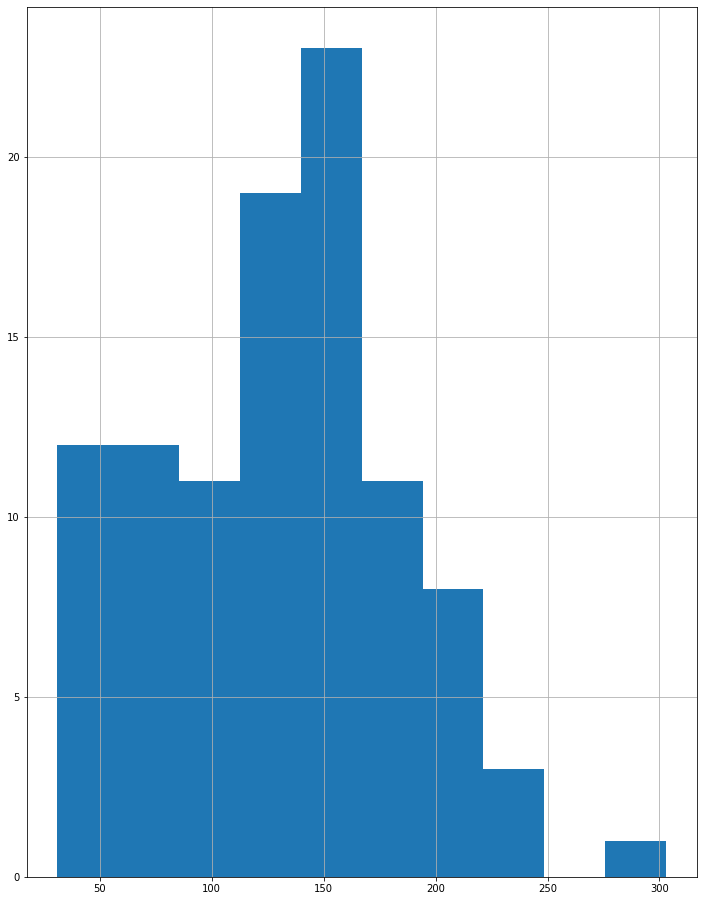

In [265]:
test_count['time_in_cycles'].hist()

In [266]:
import seaborn as sns
import matplotlib.pyplot as plt

In [267]:
from pylab import rcParams
rcParams['figure.figsize'] = 12,16

Text(0.5, 1.0, 'Диаграмма рассеивания time_in cycles от параметра T30.')

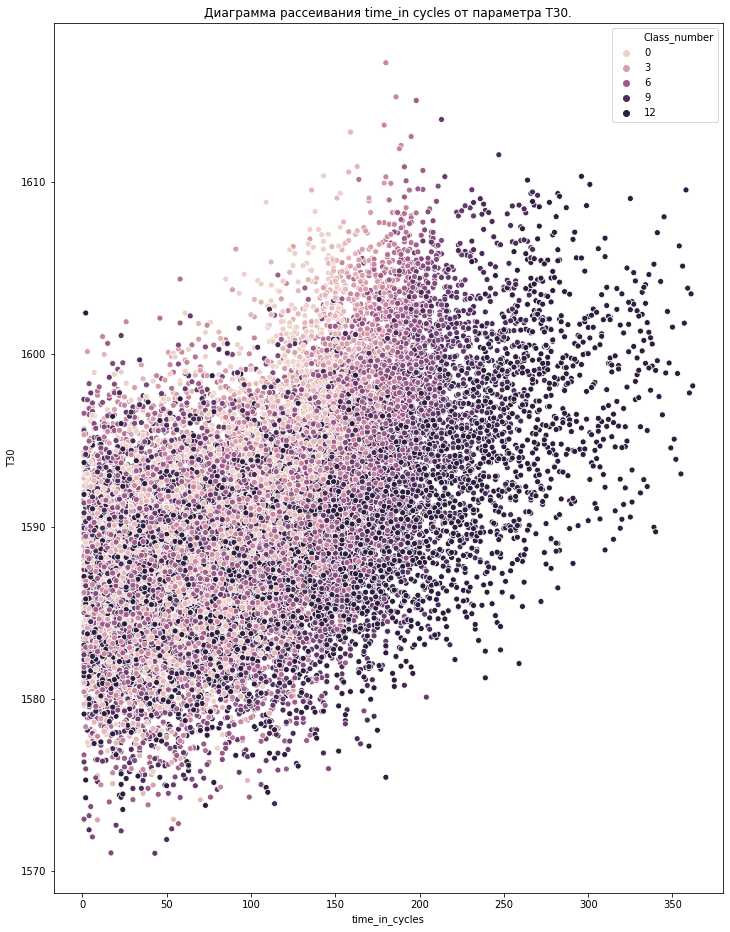

In [268]:
sns.scatterplot(x="time_in_cycles", y="T30", hue="Class_number", data=fd_001_train)
plt.title('Диаграмма рассеивания time_in cycles от параметра T30.')

## Классы сильно перемешаны, как следует из приведенной выше диаграммы рассеивания, попробуем другой подход, рассмотрим деление на  2 класса- двигатели, которым до поломки менее 20 (time_to_failure < 10) циклов, такие двигатели будут иметь метку 1 и остальные (метка 0)

In [269]:
fd_RUL = fd_001_train.groupby('unit_number')['time_in_cycles'].max().reset_index()

C:\Miniconda\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Miniconda\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


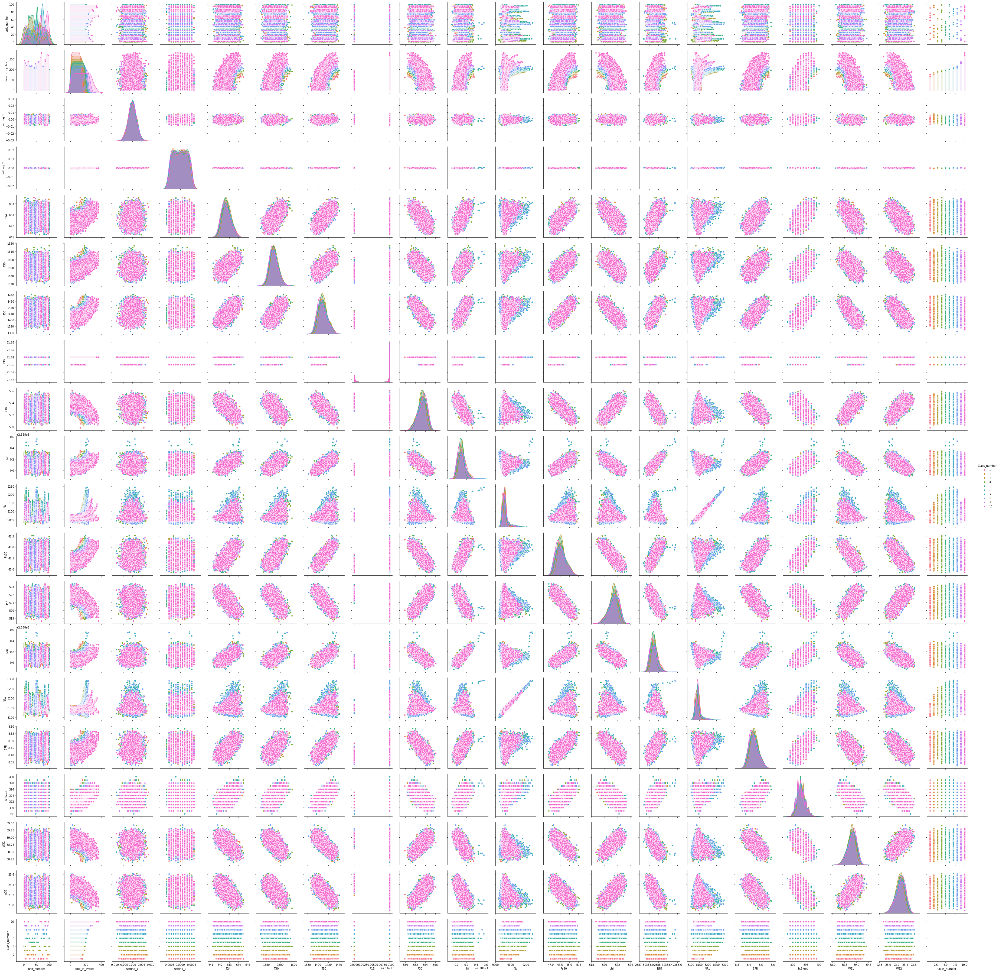

In [270]:
sns.pairplot(fd_001_train, hue="Class_number", palette="husl")

In [272]:
fd_RUL = pd.DataFrame(fd_RUL)
fd_RUL.columns = ['unit_number','max']
fd_RUL.head()

,unit_number,max
0,1,192
1,2,287
2,3,179
3,4,189
4,5,269


In [273]:
fd_001_train = fd_001_train.merge(fd_RUL, on=['unit_number'], how='left')

In [274]:
fd_001_train['RUL'] = fd_001_train['max'] - fd_001_train['time_in_cycles']


In [275]:
fd_001_train.drop(columns=['max'],inplace = True)

In [276]:
TTF = 10
fd_001_train['label'] = np.where(fd_001_train['RUL'] <= TTF, 1, 0 )

Text(0.5, 1.0, 'Диаграмма рассеивания T50 от Т30')

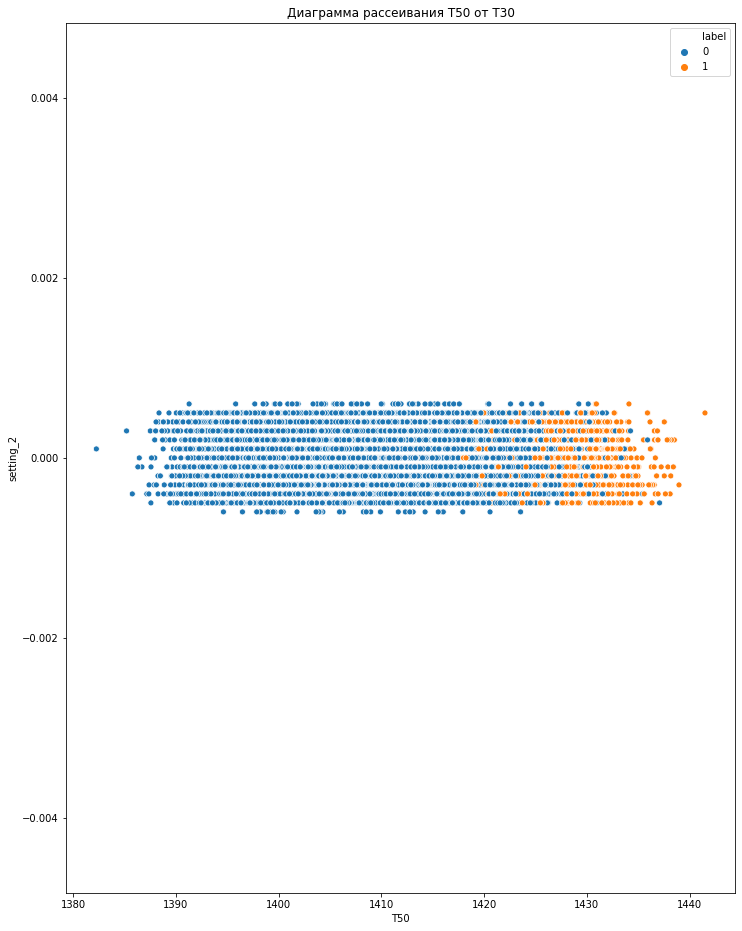

In [277]:
sns.scatterplot(x="T50", y="setting_2", hue="label", data=fd_001_train)
plt.title('Диаграмма рассеивания setting_2 от T50')

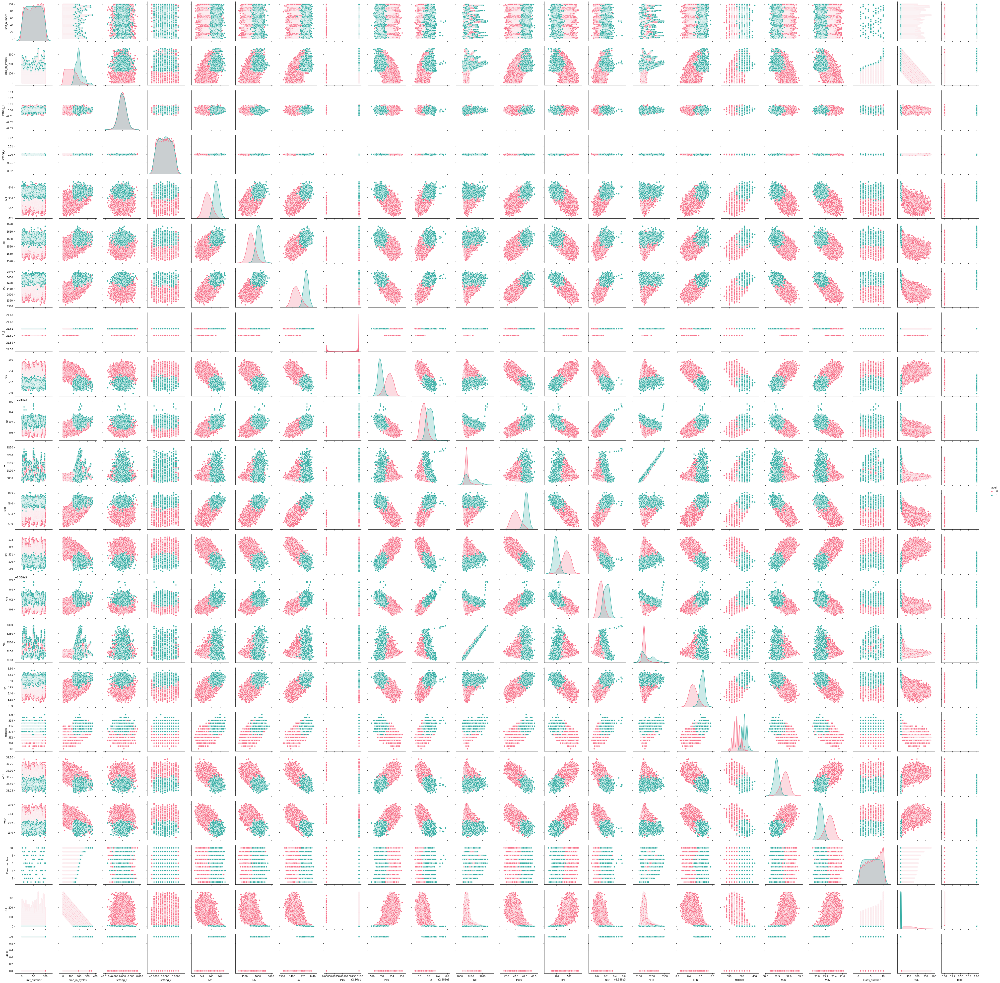

In [278]:
sns.pairplot(fd_001_train, hue="label", palette="husl")

In [280]:
fd_001_train.head()

,unit_number,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,...,phi,NRf,NRc,BPR,htBleed,W31,W32,Class_number,RUL,label
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,21.61,554.36,2388.06,...,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,4,191,0
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,21.61,553.75,2388.04,...,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,4,190,0
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,21.61,554.26,2388.08,...,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,4,189,0
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,21.61,554.45,2388.11,...,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,4,188,0
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,21.61,554.00,2388.06,...,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,4,187,0


In [281]:
train_df = fd_001_train.drop(columns = ['unit_number','RUL'])

In [282]:
train_df.head()

,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,Nc,Ps30,phi,NRf,NRc,BPR,htBleed,W31,W32,Class_number,label
0,1,-0.0007,-0.0004,641.82,1589.70,1400.60,21.61,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,4,0
1,2,0.0019,-0.0003,642.15,1591.82,1403.14,21.61,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,4,0
2,3,-0.0043,0.0003,642.35,1587.99,1404.20,21.61,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,4,0
3,4,0.0007,0.0000,642.35,1582.79,1401.87,21.61,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,4,0
4,5,-0.0019,-0.0002,642.37,1582.85,1406.22,21.61,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,4,0


In [297]:
train_df.drop(columns=['Class_number'],inplace = True)

In [298]:
X = train_df.iloc[:,:18].to_numpy() 
Y = train_df.iloc[:,18:].to_numpy()

In [299]:
X.shape

(20631, 18)

In [300]:
Y.shape

(20631, 1)

In [301]:
Y = np.ravel(Y)

In [302]:
Y.shape

(20631,)

In [304]:
# Балансировка классов для улучшения работы классификатора
from imblearn.over_sampling import RandomOverSampler
#from imblearn.under_sampling import RandomUnderSampler
ros = RandomOverSampler(random_state=0)
ros.fit(X, Y)
X_resampled, y_resampled = ros.fit_sample(X, Y)
print('Количество элементов до операции:', len(X))
print('Количество элементов после операции:', len(X_resampled))

Количество элементов до операции: 20631
Количество элементов после операции: 39062


In [305]:
# Здесь делим данные на обучающую выборку и тестовую , test_size = 0.2 задает долю тестовой выборки = 20%
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_resampled,y_resampled,test_size = 0.2,random_state = 3)

In [306]:
from sklearn.ensemble import RandomForestClassifier

In [307]:
forest = RandomForestClassifier(n_estimators=90 ,max_depth = 1, random_state=193)

In [308]:
forest.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=1, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=90, n_jobs=None,
            oob_score=False, random_state=193, verbose=0, warm_start=False)

In [309]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [310]:
accuracy_score(y_test, forest.predict(X_test))

0.9513631127607833

In [311]:
precision_score(y_test, forest.predict(X_test))

0.9159763313609467

In [312]:
recall_score(y_test, forest.predict(X_test))

0.993581514762516

In [313]:
f1_score(y_test, forest.predict(X_test))

0.9532019704433496

## Подготовим тестовые данные для классификации

In [314]:
fd_001_test.drop(columns=['Nf_dmd','PCNfR_dmd','P2','T2','TRA','farB','epr'],inplace=True)

In [315]:
test_max = fd_001_test.groupby('unit_number')['time_in_cycles'].max().reset_index()
test_max.columns = ['unit_number','max']

In [316]:
fd_001_test = fd_001_test.merge(test_max, on=['unit_number'], how='left')

In [317]:
fd_001_test.head()

,unit_number,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,Nc,Ps30,phi,NRf,NRc,BPR,htBleed,W31,W32,max
0,1,1,0.0023,0.0003,643.02,1585.29,1398.21,21.61,553.90,2388.04,9050.17,47.20,521.72,2388.03,8125.55,8.4052,392,38.86,23.3735,31
1,1,2,-0.0027,-0.0003,641.71,1588.45,1395.42,21.61,554.85,2388.01,9054.42,47.50,522.16,2388.06,8139.62,8.3803,393,39.02,23.3916,31
2,1,3,0.0003,0.0001,642.46,1586.94,1401.34,21.61,554.11,2388.05,9056.96,47.50,521.97,2388.03,8130.10,8.4441,393,39.08,23.4166,31
3,1,4,0.0042,0.0000,642.44,1584.12,1406.42,21.61,554.07,2388.03,9045.29,47.28,521.38,2388.05,8132.90,8.3917,391,39.00,23.3737,31
4,1,5,0.0014,0.0000,642.51,1587.19,1401.92,21.61,554.16,2388.01,9044.55,47.31,522.15,2388.03,8129.54,8.4031,390,38.99,23.4130,31


In [318]:
test = fd_001_test[fd_001_test['time_in_cycles'] == fd_001_test['max']].reset_index()

In [319]:
test.drop(columns=['index','max','unit_number'],inplace = True)

In [320]:
test.head()

,time_in_cycles,setting_1,setting_2,T24,T30,T50,P15,P30,Nf,Nc,Ps30,phi,NRf,NRc,BPR,htBleed,W31,W32
0,31,-0.0006,0.0004,642.58,1581.22,1398.91,21.61,554.42,2388.08,9056.40,47.23,521.79,2388.06,8130.11,8.4024,393,38.81,23.3552
1,49,0.0018,-0.0001,642.55,1586.59,1410.83,21.61,553.52,2388.10,9044.77,47.67,521.74,2388.09,8126.90,8.4505,391,38.81,23.2618
2,126,-0.0016,0.0004,642.88,1589.75,1418.89,21.61,552.59,2388.16,9049.26,47.88,520.83,2388.14,8131.46,8.4119,395,38.93,23.2740
3,106,0.0012,0.0004,642.78,1594.53,1406.88,21.61,552.64,2388.13,9051.30,47.65,521.88,2388.11,8133.64,8.4634,395,38.58,23.2581
4,98,-0.0013,-0.0004,642.27,1589.94,1419.36,21.61,553.29,2388.10,9053.99,47.46,521.00,2388.15,8125.74,8.4362,394,38.75,23.4117


In [321]:
X_001_test = test.to_numpy()

In [322]:
X_001_test.shape

(100, 18)

In [323]:
# предсказание для X_001_test, время до поломки = TTF =10
predicted = pd.DataFrame(forest.predict(X_001_test))

In [324]:
predicted.columns=['RUL<=10']

In [325]:
predicted['unit_number'] = predicted.index + 1

In [326]:
predicted.head()

,RUL<=10,unit_number
0,0,1
1,0,2
2,0,3
3,0,4
4,0,5


In [327]:
RUL = pd.read_csv('C:/Users/Игорь/Downloads/nasa-cmaps/CMaps/RUL_FD001.txt',header=None,sep=' ')

In [328]:
RUL.drop(columns=[1],inplace =True)

In [329]:
RUL.columns = ['max']

In [330]:
RUL['unit_number'] = RUL.index + 1

In [331]:
RUL.head()

,max,unit_number
0,112,1
1,98,2
2,69,3
3,82,4
4,91,5


In [332]:
predicted = predicted.merge(RUL, on=['unit_number'], how='left')

In [333]:
predicted[predicted['max']<=10]

,RUL<=10,unit_number,max
30,1,31,8
33,1,34,7
41,1,42,10
67,1,68,8
75,1,76,10
80,1,81,8
81,1,82,9


In [334]:
predicted[predicted['RUL<=10']==1]

,RUL<=10,unit_number,max
19,1,20,16
30,1,31,8
33,1,34,7
34,1,35,11
35,1,36,19
41,1,42,10
48,1,49,21
55,1,56,15
65,1,66,14
67,1,68,8


## Выводы
Как можно видеть на этом этапе модель классификации показывает вполне адекватные предсказания. Верно идентифицированы все двигатели, у которых ресурс менее либо равен 10, максимальная ошибка для неверно идентифицированных при этом 28 (для двигателя 91) .В  дальнейшем предполагается оформление процесса подготовки данных и вывода предсказаний  в виде функции, принимающей на вход тренировочные , тестовые данные, а также параметры окна (время до отказа на шаге  i    [ TTF * i ; TTF * (i + 1) ] ), в результате будет формироваться dataframe "predicted", в котором колонками будут предсказания для "окна", до момента, когда все двигатели будут классифицированы или TTF * (i+1) станет больше максимального значения параметра RUL из тренировочных данных. Для вывода итогового результата будем использовать наименьший параметр "RUL<= TTF * (i+1)" датасета predicted (см. образец выше), при котором этот двигатель был положительно классифицирован (это следует из функции оценки качества алгоритма, описанной в https://github.com/ikucherevsky/netology_diplom/blob/master/Damage%20Propagation%20Modeling.pdf) То есть раннее предсказание поломки штрафуется меньше чем более позднее.


Кроме этого, возможно будет полезно исследовать смещение правильного ответа относительно предсказаний в несколько раз классифицированных двигателях для поиска оптимального алгоритма выбора итогового результата, вместо выбора по минимальному TTF